In [16]:
#Prepare an image using DetrFeatureExtractor

In [ ]:
#!pip install -q git+https://github.com/huggingface/transformers.git timm


In [14]:
from PIL import Image
import requests
import matplotlib.pyplot as plt

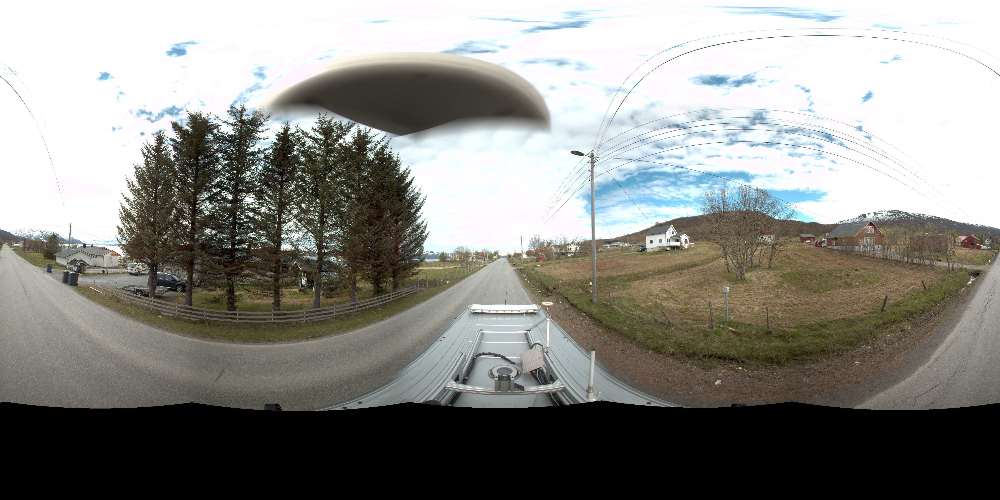

In [2]:
pm = "/storage/Projects/notebooks/detectron2/images/image4.jpg"
im = Image.open(pm)
im

In [ ]:
#Prepare the image for the model using DetrFeatureExtractor

In [3]:
from transformers import DetrFeatureExtractor, DetrForSegmentation
feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-101-panoptic")
encoding = feature_extractor(im, return_tensors='pt')
encoding.keys()

dict_keys(['pixel_values', 'pixel_mask'])

In [4]:
encoding['pixel_values'].shape

torch.Size([1, 3, 666, 1332])

In [17]:
#Forward Pass

In [5]:
from transformers import DetrForSegmentation
model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-101-panoptic")

In [6]:
outputs = model(**encoding)

In [ ]:
#model 

In [ ]:
#Merge the masks using a pixel-wise argmax, to obtain a unified panoptic segmentation of the image. 

In [7]:
import torch
processed_sizes = torch.as_tensor(encoding['pixel_values'].shape[-2:]).unsqueeze(0)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes)[0]

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


In [18]:
#Visualization using Detectron2

In [ ]:
#!git clone https://github.com/facebookresearch/detectron2.git
#!pip install ./detectron2
#!pip install --upgrade pyyaml

In [8]:
%cd detectron2

/storage/Projects/notebooks/detectron2


In [9]:
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [10]:
def cv2_imshow(img):
    img = img[:,:,[2,1,0]]
    img = Image.fromarray(img)
    plt.figure(figsize=(20, 20))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

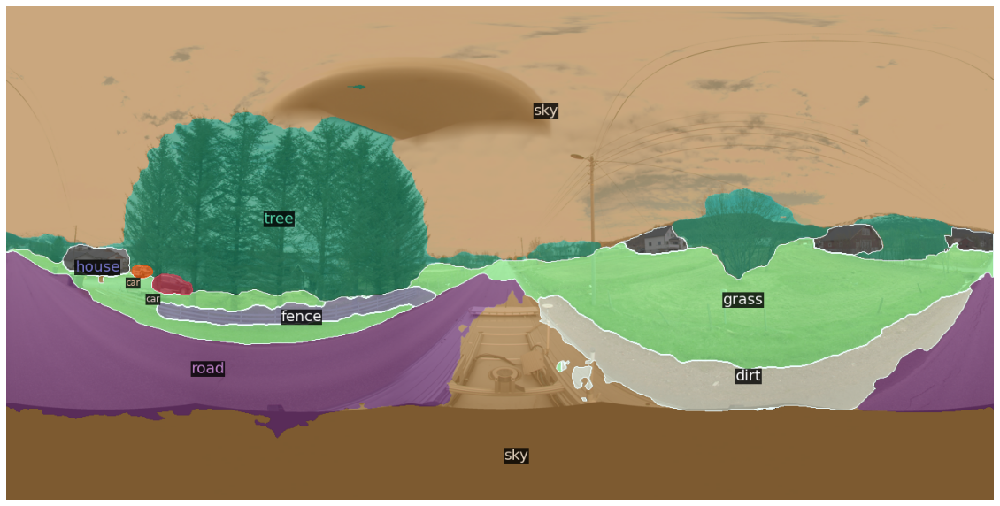

In [15]:
import io
import seaborn as sns
import numpy
from copy import deepcopy
from transformers.models.detr.feature_extraction_detr import rgb_to_id, id_to_rgb


# We extract the segments info and the panoptic result from DETR's prediction
segments_info = deepcopy(result["segments_info"])
# Panoptic predictions are stored in a special format png
panoptic_seg = Image.open(io.BytesIO(result['png_string']))
final_w, final_h = panoptic_seg.size
# We convert the png into an segment id map
panoptic_seg = numpy.array(panoptic_seg, dtype=numpy.uint8)
panoptic_seg = torch.from_numpy(rgb_to_id(panoptic_seg))
    
# Detectron2 uses a different numbering of coco classes, here we convert the class ids accordingly
meta = MetadataCatalog.get("coco_2017_val_panoptic_separated")
for i in range(len(segments_info)):
    c = segments_info[i]["category_id"]
    segments_info[i]["category_id"] = meta.thing_dataset_id_to_contiguous_id[c] if segments_info[i]["isthing"] else meta.stuff_dataset_id_to_contiguous_id[c]

# Finally we visualize the prediction
v = Visualizer(numpy.array(im.copy().resize((final_w, final_h)))[:, :, ::-1], meta, scale=1.0)
v._default_font_size = 20
v = v.draw_panoptic_seg_predictions(panoptic_seg, segments_info, area_threshold=0)
cv2_imshow(v.get_image())